<a href="https://www.kaggle.com/code/rohanambad/vehicle-data-pca-and-svm?scriptVersionId=107266159" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [5]:

import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import pandas_profiling 
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_color_codes()
sns.set(style="whitegrid")
%matplotlib inline
from scipy.stats import zscore
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

#setting up for customized printing
from IPython.display import Markdown, display
from IPython.display import HTML
def printmd(string, color=None):
    colorstr = "<span style='color:{}'>{}</span>".format(color, string)
    display(Markdown(colorstr))
    
#function to display dataframes side by side    
from IPython.display import display_html
def display_side_by_side(args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline;margin-left:50px !important;margin-right: 40px !important"'),raw=True)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
vehicle = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Ved 27 Sept/Part3 - vehicle.csv")

In [13]:
vehicle.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [6]:
def distplot(figRows,figCols,xSize, ySize, features, colors):
    f, axes = plt.subplots(figRows, figCols, figsize=(xSize, ySize))
    
    features = np.array(features).reshape(figRows, figCols)
    colors = np.array(colors).reshape(figRows, figCols)
    
    for row in range(figRows):
        for col in range(figCols):
            if (figRows == 1 and figCols == 1) :
                axesplt = axes
            elif (figRows == 1 and figCols > 1) :
                axesplt = axes[col]
            elif (figRows > 1 and figCols == 1) :
                axesplt = axes[row]
            else:
                axesplt = axes[row][col]
            plot = sns.distplot(vehicle[features[row][col]], color=colors[row][col], ax=axesplt, kde=True, hist_kws={"edgecolor":"k"})
            plot.set_xlabel(features[row][col],fontsize=20)

In [7]:
def scatterplot(rowFeature, colFeature, data):
    f, axes = plt.subplots(1, 1, figsize=(10, 8))
        
    plot=sns.scatterplot(x=rowFeature, y=colFeature, data=data, hue='class', style='class', ax=axes)
    plot.set_xlabel(rowFeature,fontsize=20)
    plot.set_ylabel(colFeature,fontsize=20)   

In [8]:
def boxplot(figRows,figCols,xSize, ySize, features, colors, hue=None, orient='h', rotation=30):
    f, axes = plt.subplots(figRows, figCols, figsize=(xSize, ySize))
    
    features = np.array(features).reshape(figRows, figCols)
    colors = np.array(colors).reshape(figRows, figCols)
    
    for row in range(figRows):
        for col in range(figCols):
            if (figRows == 1 and figCols == 1) :
                axesplt = axes
            elif (figRows == 1 and figCols > 1) :
                axesplt = axes[col]
            elif (figRows > 1 and figCols == 1) :
                axesplt = axes[row]
            else:
                axesplt = axes[row][col]
            plot = sns.boxplot(features[row][col], data= vehicle, color=colors[row][col], ax=axesplt, orient=orient, hue=hue)
            plot.set_ylabel('',fontsize=20)
            plot.set_xticklabels(rotation=rotation, labels=[features[row][col]], fontweight='demibold',fontsize='large')

In [9]:
def boxplot_all(xSize, ySize, palette, data):
    f, axes = plt.subplots(1, 1, figsize=(xSize, ySize))
    plot = sns.boxplot(x='variable',y='value', data= pd.melt(data), palette='Set1', ax=axes, orient='v')
    plot.set_xlabel('',fontsize=20)
    plot.set_xticklabels(rotation=60, labels=plot.get_xticklabels(),fontweight='demibold',fontsize='x-large')

In [10]:
def countplot(figRows,figCols,xSize, ySize, features, colors=None,palette=None,hue=None, orient=None, rotation=90):
    f, axes = plt.subplots(figRows, figCols, figsize=(xSize, ySize))
    
    features = np.array(features).reshape(figRows, figCols)
    if(colors is not None):
        colors = np.array(colors).reshape(figRows, figCols)
    if(palette is not None):
        palette = np.array(palette).reshape(figRows, figCols)
    
    for row in range(figRows):
        for col in range(figCols):
            if (figRows == 1 and figCols == 1) :
                axesplt = axes
            elif (figRows == 1 and figCols > 1) :
                axesplt = axes[col]
            elif (figRows > 1 and figCols == 1) :
                axesplt = axes[row]
            else:
                axesplt = axes[row][col]
                
            if(colors is None):
                plot = sns.countplot(features[row][col], data=vehicle, palette=palette[row][col], ax=axesplt, orient=orient, hue=hue)
            elif(palette is None):
                plot = sns.countplot(features[row][col], data=vehicle, color=colors[row][col], ax=axesplt, orient=orient, hue=hue)
            plot.set_title(features[row][col],fontsize=20)
            plot.set_xlabel(None)
            plot.set_xticklabels(rotation=rotation, labels=plot.get_xticklabels(),fontweight='demibold',fontsize='large')

# EDA

In [14]:
print('The total number of rows :', vehicle.shape[0])
print('The total number of columns :', vehicle.shape[1])

The total number of rows : 846

The total number of columns : 19


In [15]:
vehicle.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 846 entries, 0 to 845

Data columns (total 19 columns):

 #   Column                       Non-Null Count  Dtype  

---  ------                       --------------  -----  

 0   compactness                  846 non-null    int64  

 1   circularity                  841 non-null    float64

 2   distance_circularity         842 non-null    float64

 3   radius_ratio                 840 non-null    float64

 4   pr.axis_aspect_ratio         844 non-null    float64

 5   max.length_aspect_ratio      846 non-null    int64  

 6   scatter_ratio                845 non-null    float64

 7   elongatedness                845 non-null    float64

 8   pr.axis_rectangularity       843 non-null    float64

 9   max.length_rectangularity    846 non-null    int64  

 10  scaled_variance              843 non-null    float64

 11  scaled_variance.1            844 non-null    float64

 12  scaled_radius_of_gyration    844 non-null    float64

 13  sc

In [16]:
display(vehicle.isna().sum().sort_values())
print('===================')
printmd('**CONCLUSION**: As seen from the data above, we conclude there are **"Missing"** values in the data', color="red")

compactness                    0
hollows_ratio                  0
max.length_aspect_ratio        0
max.length_rectangularity      0
class                          0
scatter_ratio                  1
elongatedness                  1
skewness_about.1               1
skewness_about.2               1
pr.axis_aspect_ratio           2
scaled_variance.1              2
scaled_radius_of_gyration      2
pr.axis_rectangularity         3
scaled_variance                3
distance_circularity           4
scaled_radius_of_gyration.1    4
circularity                    5
skewness_about                 6
radius_ratio                   6
dtype: int64

<span style='color:red'>**CONCLUSION**: As seen from the data above, we conclude there are **"Missing"** values in the data</span>

In [17]:
display(vehicle.describe().transpose())

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [19]:
#Missing value treatment- median
from sklearn.impute import SimpleImputer
sim = SimpleImputer(missing_values=np.nan, strategy='median')
cols = vehicle.columns[:18]
vehicle.iloc[:,:18] = sim.fit_transform(vehicle.iloc[:,:18])
vehicle.iloc[:,:18] = pd.DataFrame(vehicle.iloc[:,:18], columns=cols)

In [20]:
display(vehicle.isna().sum().sort_values())
print('===================')
printmd('**CONCLUSION**: **"Missing"** values are replaced with **Median** of the respective attributes', color="green")

compactness                    0
skewness_about.2               0
skewness_about.1               0
skewness_about                 0
scaled_radius_of_gyration.1    0
scaled_radius_of_gyration      0
scaled_variance.1              0
scaled_variance                0
hollows_ratio                  0
max.length_rectangularity      0
elongatedness                  0
scatter_ratio                  0
max.length_aspect_ratio        0
pr.axis_aspect_ratio           0
radius_ratio                   0
distance_circularity           0
circularity                    0
pr.axis_rectangularity         0
class                          0
dtype: int64

<span style='color:green'>**CONCLUSION**: **"Missing"** values are replaced with **Median** of the respective attributes</span>

In [21]:
pal = sns.color_palette(palette='Set1', n_colors=16)

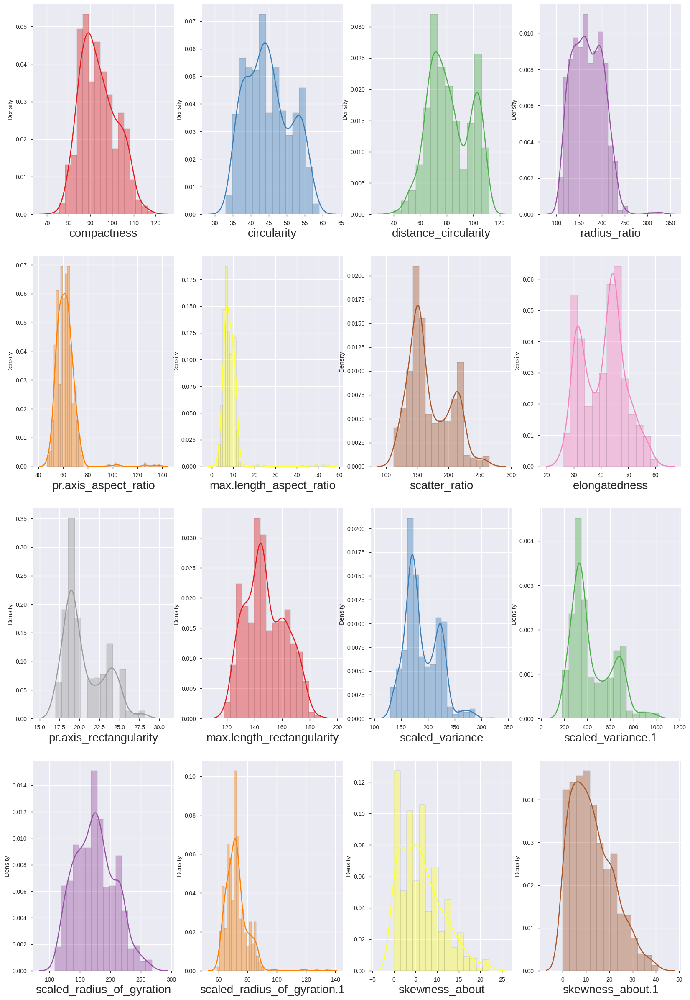

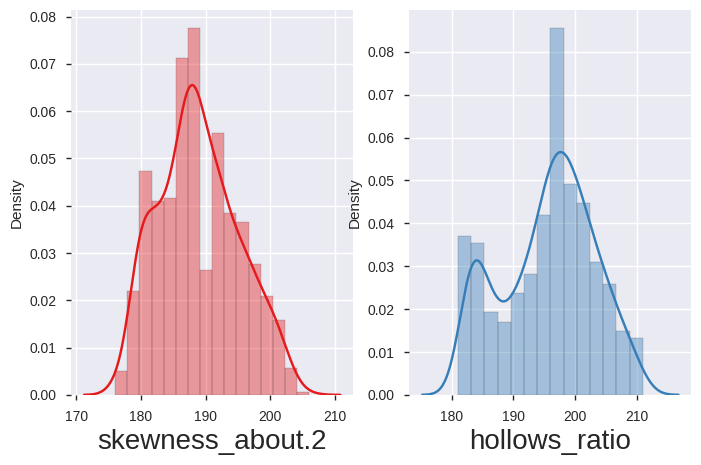

In [22]:
distplot(4, 4, 20, 30, vehicle.columns[:16].tolist(), pal.as_hex())
distplot(1, 2, 8, 5, vehicle.columns[16:18].tolist(), pal.as_hex()[:2])

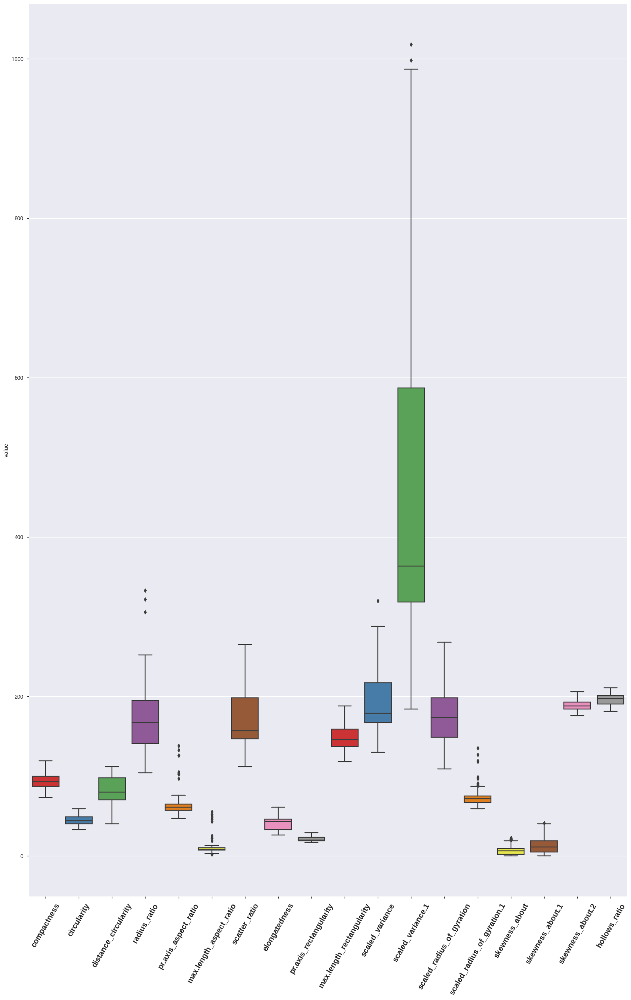

In [23]:
#checking the presence of the outliers
boxplot_all(20,30,palette=['Set1'], data =vehicle.iloc[:,:18])

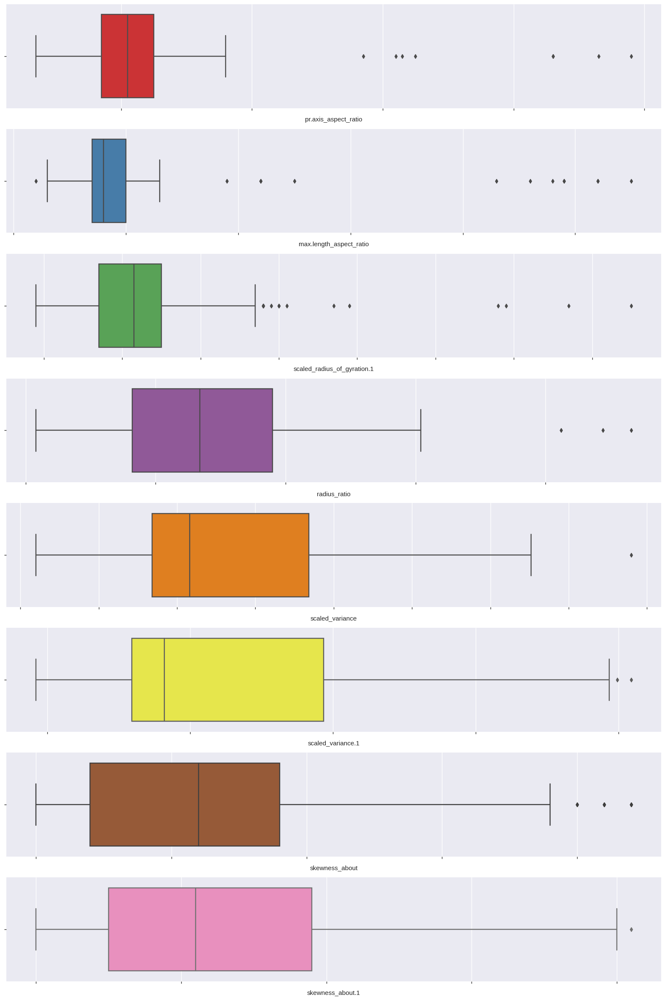

In [24]:
boxplot(8, 1, 20, 30, orient='h', 
        features=['pr.axis_aspect_ratio',
                  'max.length_aspect_ratio',
                  'scaled_radius_of_gyration.1',
                  'radius_ratio',
                  'scaled_variance',
                  'scaled_variance.1',
                 'skewness_about',
                 'skewness_about.1'], 
        colors=pal.as_hex()[:8])

In [25]:
#bivariate analysis
def point_box_bar_plot(row, col, figRow, figCol, palette='rocket', fontsize='large', fontweight='demibold'):
    sns.set(style="whitegrid")
    f, axes = plt.subplots(3, 1, figsize=(figRow, figCol))
    pplot=sns.pointplot(row,col, data=vehicle, ax=axes[0], linestyles=['--'])
    pplot.set_xlabel(None)
    pplot.set_xticklabels(labels=pplot.get_xticklabels(),fontweight=fontweight,fontsize=fontsize)
    bxplot=sns.boxplot(row,col, data=vehicle, ax=axes[1],palette='Paired')
    bxplot.set_xlabel(None)
    bxplot.set_xticklabels(labels=bxplot.get_xticklabels(),fontweight=fontweight,fontsize=fontsize)
    bplot=sns.barplot(row,col, data=vehicle, ax=axes[2],palette=palette)
    bplot.set_xlabel(row,fontsize=20)
    bplot.set_xticklabels(labels=bplot.get_xticklabels(),fontweight=fontweight,fontsize=fontsize)

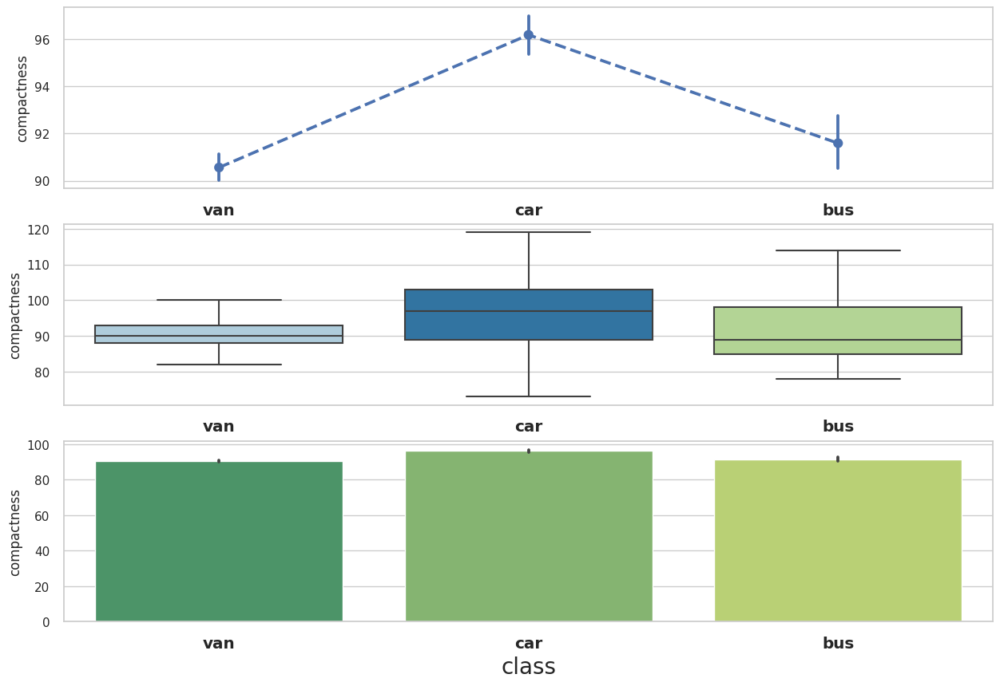

In [26]:
point_box_bar_plot('class','compactness', 15, 10, palette='summer')


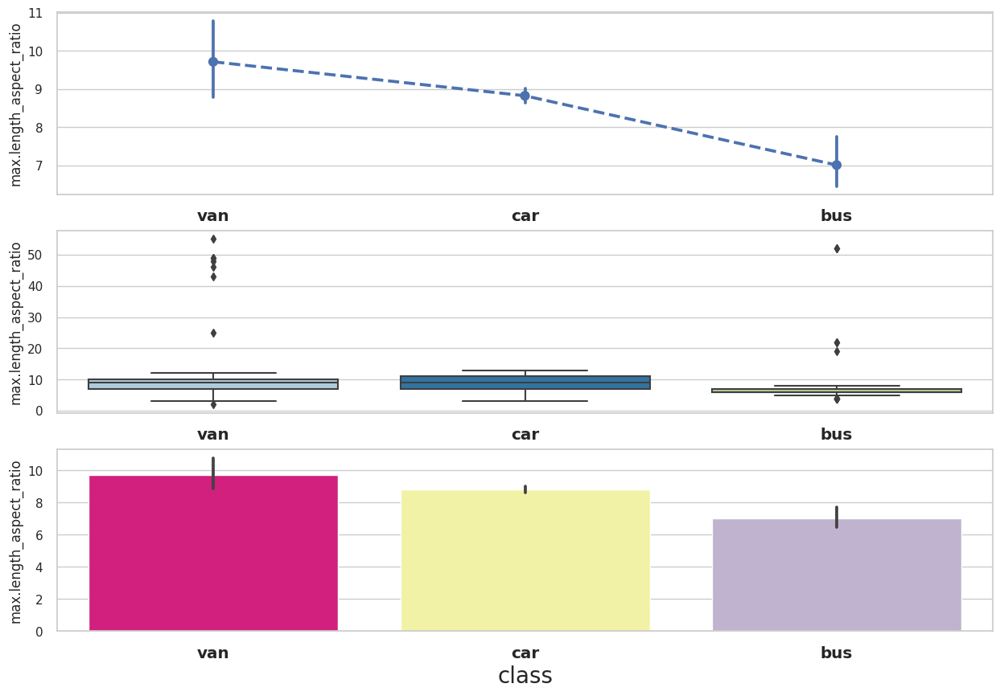

In [27]:
point_box_bar_plot('class','max.length_aspect_ratio', 15, 10, palette='Accent_r')


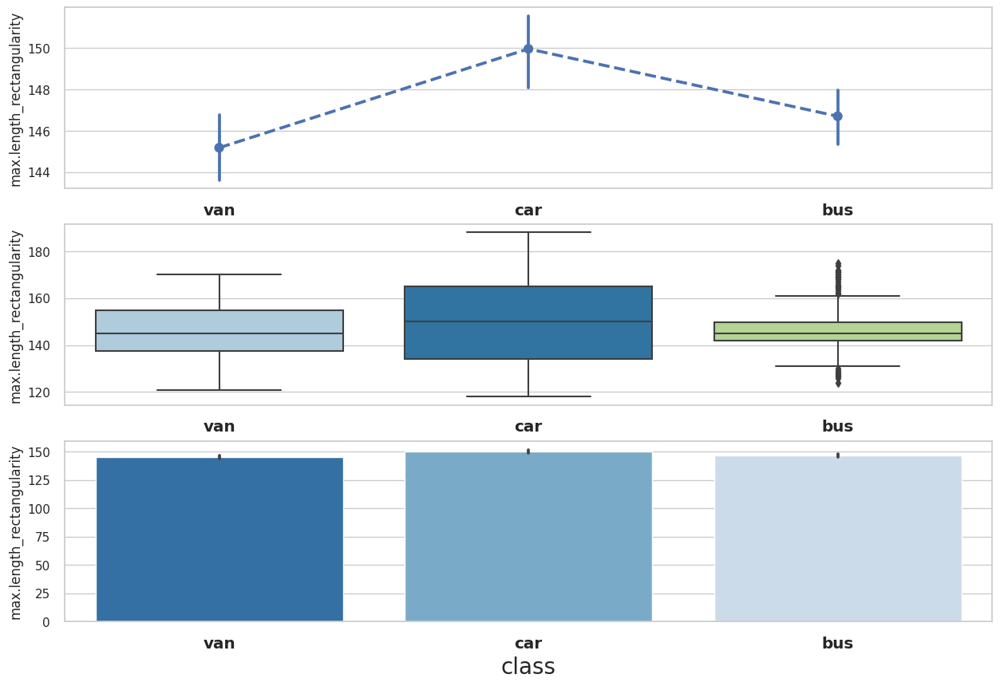

In [28]:
point_box_bar_plot('class','max.length_rectangularity', 15, 10, palette='Blues_r')
#Outliers are detected for van and bus.
#No outliers for car.
#max.length_aspect_ratio of the van is higher because of several large outliers. It is followed by car and then bus.


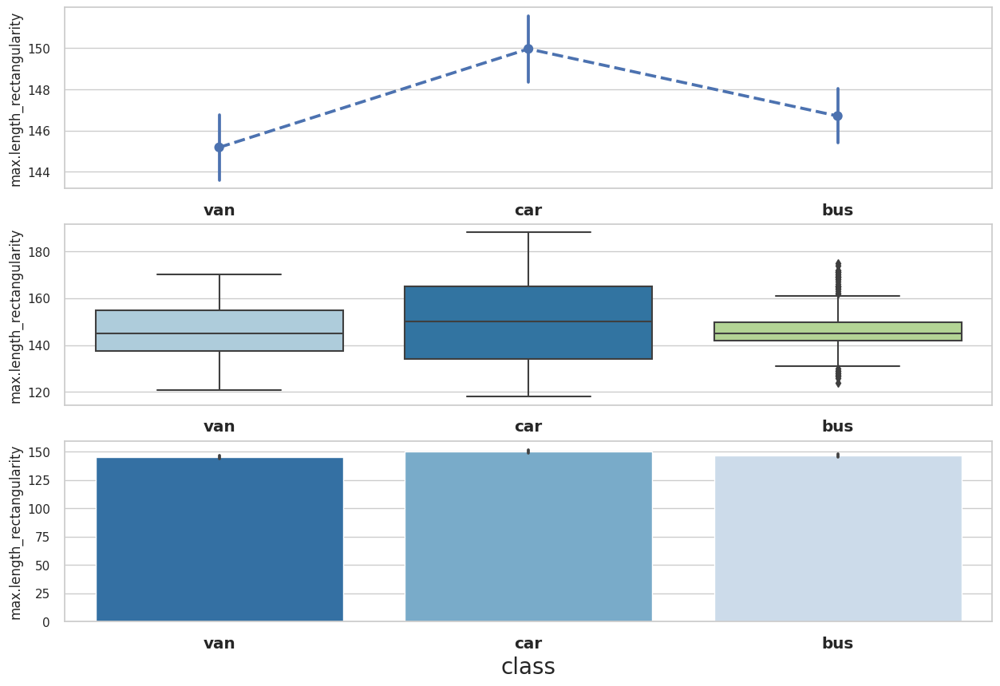

In [29]:
point_box_bar_plot('class','max.length_rectangularity', 15, 10, palette='Blues_r')
#max.length_rectangularity of the car is higher followed by bus and then van.
#Outliers are detected for bus and hence its value is shown higher than van despite van having larger range of max.length_rectangularity


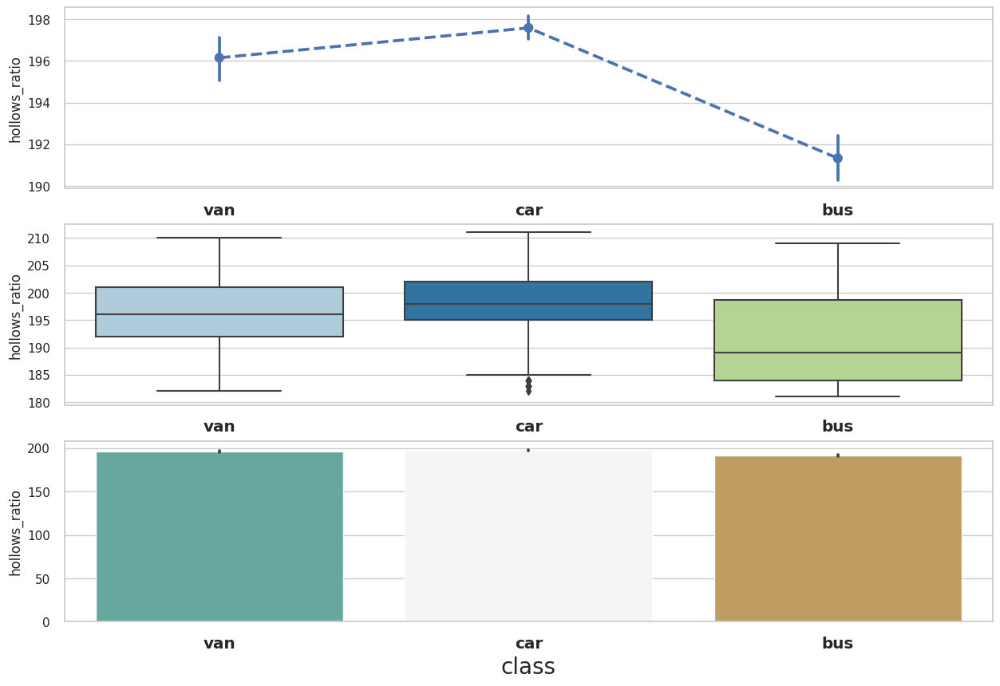

In [30]:
point_box_bar_plot('class','hollows_ratio', 15, 10, palette='BrBG_r')
#hollows_ratio of the car and van are very close followed by bus.
#Outliers are detected for car on the lower side
#bus is having large range of hollows_ratio compared to others.

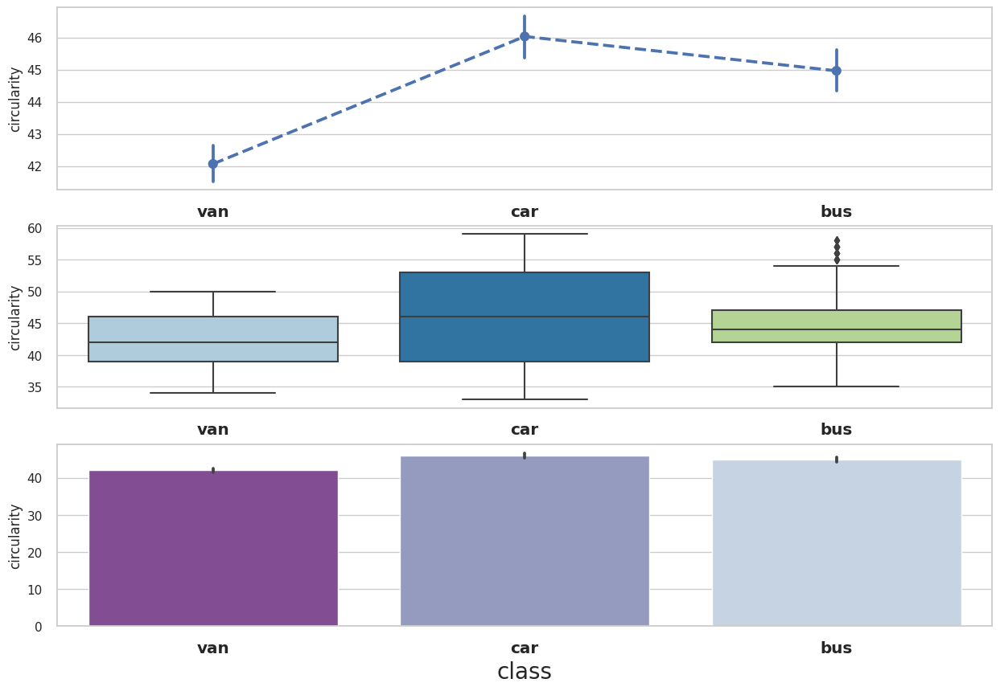

In [31]:
point_box_bar_plot('class','circularity', 15, 10, palette='BuPu_r')
#circularity of the car and bus are very close followed by van.
#Outliers are detected for bus on the higher side
#car is having large range of circularity compared to others.

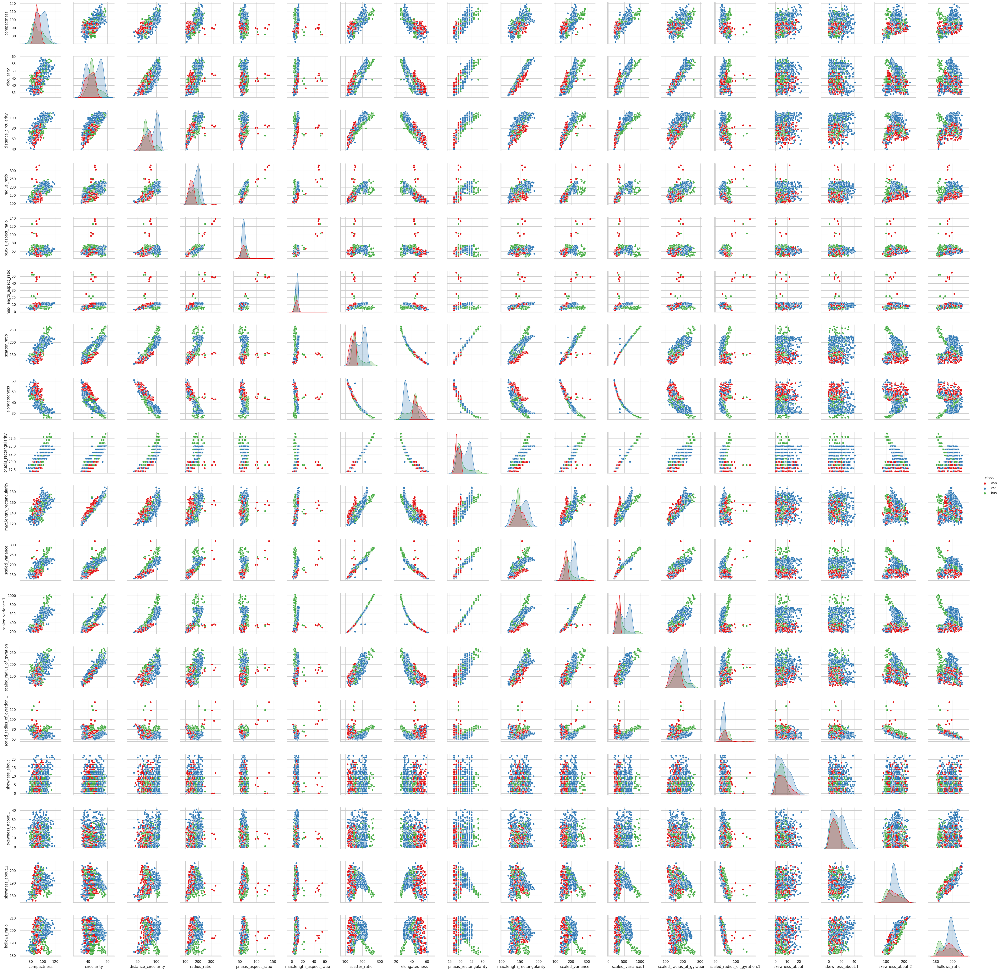

In [32]:
#Multivariate analysis
sns.pairplot(data=vehicle, hue='class', palette='Set1', diag_kind='kde')


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5]),
 <a list of 18 Text major ticklabel objects>)

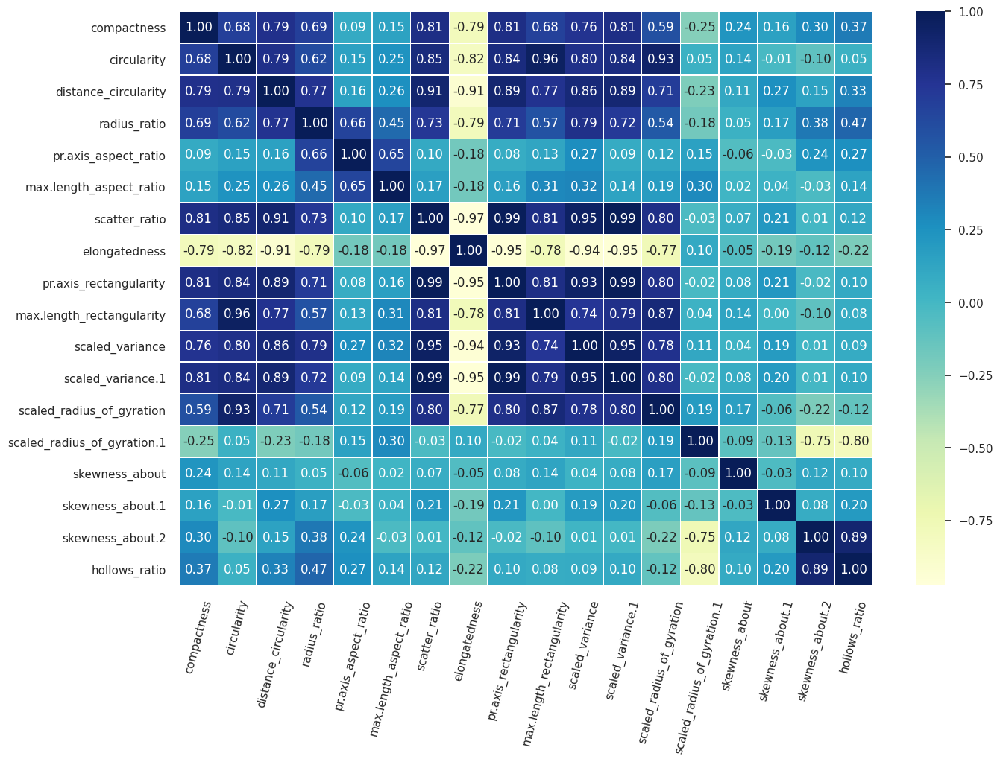

In [33]:
f, axes = plt.subplots(1, 1, figsize=(15, 10))
cor_mat = vehicle.corr()
hplot = sns.heatmap(cor_mat, annot=True, fmt=".2f", ax=axes, linecolor='white', linewidths=0.2, cmap='YlGnBu')
plt.xticks(rotation=75)

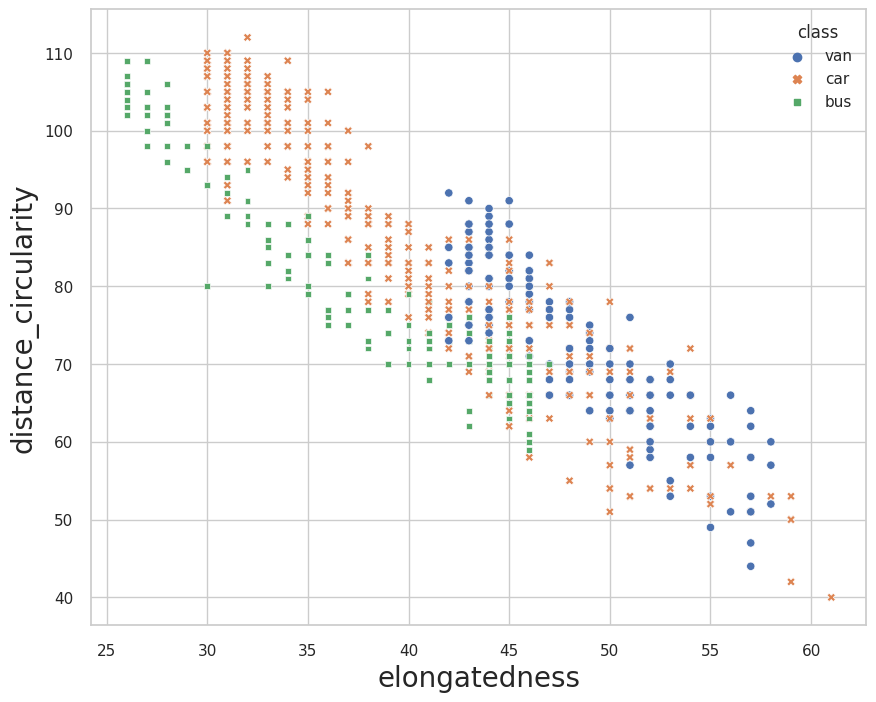

In [34]:
scatterplot('elongatedness', 'distance_circularity', vehicle)


In [35]:
vehicle=vehicle.replace({'skewness_about': {0: vehicle['skewness_about'].median()}}) 
vehicle=vehicle.replace({'skewness_about.1': {0: vehicle['skewness_about.1'].median()}}) 

In [36]:
vehicle_new = vehicle.copy()

In [37]:
def CheckCorrelationUpper(data):
    # Create correlation matrix
    corr_matrix = data.corr().abs()
    # Select upper triangle of correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
    f, axes = plt.subplots(1, 1, figsize=(15, 10))
    sns.heatmap(upper,cmap='YlGnBu', annot=True, fmt=".2f", ax=axes, linecolor='white', linewidths=0.2)
    plt.xticks(rotation=75)
    return upper

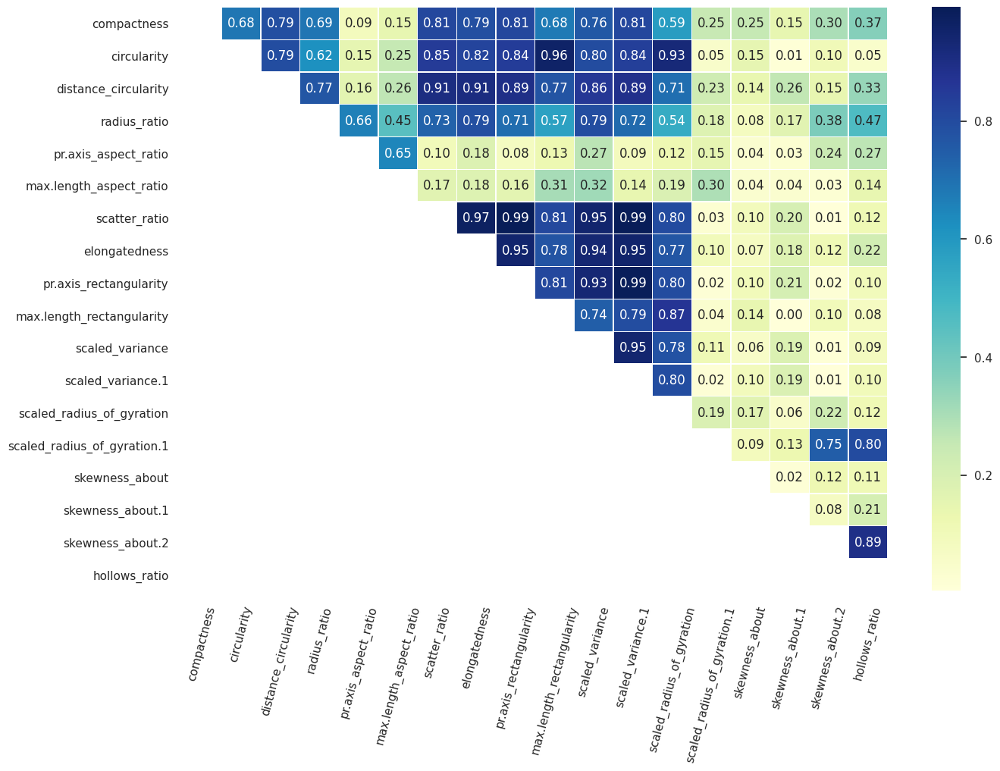

In [38]:
upper = CheckCorrelationUpper(vehicle)

In [39]:
# Find index of feature columns with correlation greater than 0.90
to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]
printmd('List of columns with correlation higher than 0.90', color='brown')
display(to_drop)

<span style='color:brown'>List of columns with correlation higher than 0.90</span>

['scatter_ratio',
 'elongatedness',
 'pr.axis_rectangularity',
 'max.length_rectangularity',
 'scaled_variance',
 'scaled_variance.1',
 'scaled_radius_of_gyration']

In [40]:
vehicle.drop(['scatter_ratio', 'elongatedness', 'pr.axis_rectangularity', 'scaled_variance.1', 'circularity'], axis=1, inplace=True)

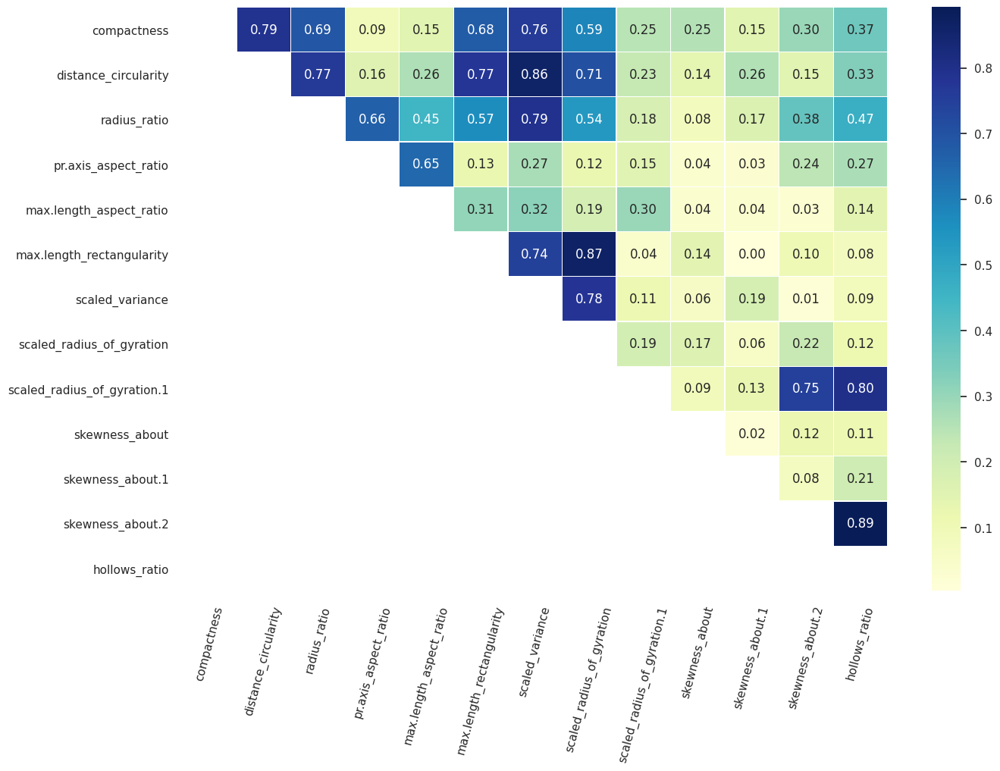

In [41]:
upper = CheckCorrelationUpper(vehicle)

In [42]:
def remove_outliers(col, data):
    outlier_col = col + "_outliers"
    data[outlier_col] = data[col]
    data[outlier_col]= zscore(data[outlier_col])

    condition = (data[outlier_col]>3) | (data[outlier_col]<-3)
    print(data[condition].shape)
    indices = data[condition].index
    data.drop(data[condition].index, axis = 0, inplace = True)
    data.drop(outlier_col, axis=1, inplace=True)
    return indices

In [43]:
vehicle.skew().sort_values()

hollows_ratio                 -0.226341
distance_circularity           0.108718
skewness_about.2               0.249985
max.length_rectangularity      0.256359
scaled_radius_of_gyration      0.279910
compactness                    0.381271
radius_ratio                   0.397572
scaled_variance                0.655598
skewness_about.1               0.745118
skewness_about                 0.917076
scaled_radius_of_gyration.1    2.089979
pr.axis_aspect_ratio           3.835392
max.length_aspect_ratio        6.778394
dtype: float64

# Observations
max.length_aspect_ratio, pr.axis_aspect_ratio, scaled_radius_of_gyration.1 are highly skewed as value is above 2

scatter_ratio, scaled_variance, skewness_about.1, pr.axis_rectangularity, skewness_about, scaled_variance.1 are moderately skewed
All other attributes given below are evenly distributed as skewness value is close to zero.

hollows_ratio, elongatedness, distance_circularity, skewness_about.2, max.length_rectangularity, circularity, scaled_radius_of_gyration, compactness, radius_ratio

In [44]:
max_length_aspect_ratio_index = remove_outliers('max.length_aspect_ratio', vehicle)
remove_outliers('pr.axis_aspect_ratio', vehicle)
remove_outliers('scaled_radius_of_gyration.1', vehicle)

(9, 15)

(0, 15)

(0, 15)


Int64Index([], dtype='int64')

In [45]:
vehicle.shape

(837, 14)

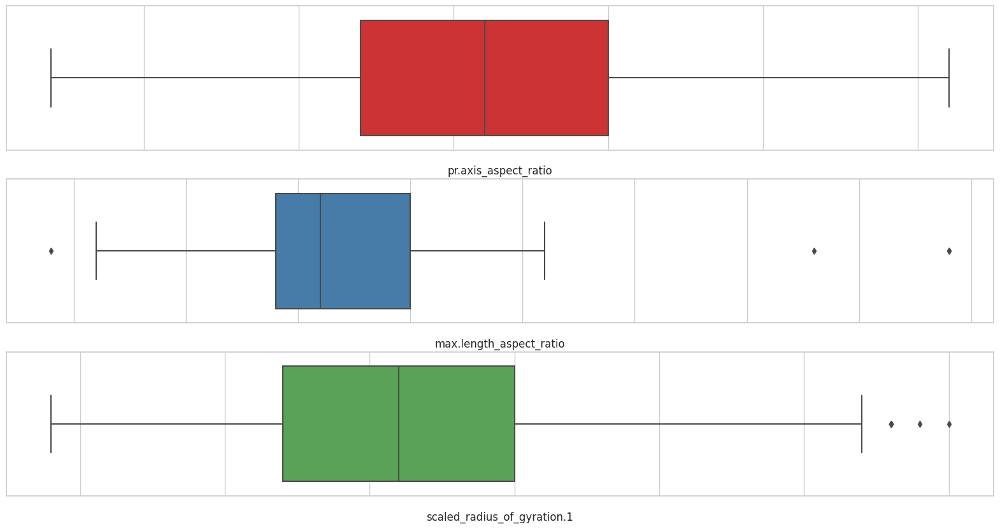

In [46]:
boxplot(3, 1, 20, 10, orient='h', 
        features=['pr.axis_aspect_ratio',
                  'max.length_aspect_ratio',                  
                  'scaled_radius_of_gyration.1'], 
        colors=pal.as_hex()[:3])

In [47]:
vehicle.skew().sort_values()

hollows_ratio                 -0.228508
radius_ratio                   0.090299
distance_circularity           0.100900
pr.axis_aspect_ratio           0.162118
skewness_about.2               0.241363
max.length_rectangularity      0.260009
scaled_radius_of_gyration      0.283031
compactness                    0.370181
scaled_radius_of_gyration.1    0.564367
scaled_variance                0.608419
max.length_aspect_ratio        0.715324
skewness_about.1               0.739859
skewness_about                 0.916228
dtype: float64

In [48]:
from sklearn.preprocessing import LabelEncoder   # import label encoder

def lencode(col, data):
    labelencoder = LabelEncoder()
    data[col] = labelencoder.fit_transform(data[col]) # returns label encoded variable(s)
    return data

In [49]:
vehicle = lencode('class', vehicle)

In [50]:
vehicle['class'].value_counts()

1    429
0    216
2    192
Name: class, dtype: int64

In [51]:
from sklearn.preprocessing import StandardScaler
std_scale = StandardScaler()
vehicle.iloc[:,:13] = std_scale.fit_transform(vehicle.iloc[:,:13])

In [52]:
vehicle.head()

,compactness,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,max.length_rectangularity,scaled_variance,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,0.152918,0.053422,0.316138,1.924444,0.827841,0.757462,-0.392910,0.284934,-0.329226,-0.203879,0.345754,-0.317575,0.180493,2
1,-0.332361,0.116757,-0.846211,-0.736210,0.378196,-0.341437,-0.587332,-0.511564,-0.015016,0.464451,0.114052,0.007178,0.449067,2
2,1.244796,1.510123,1.289997,0.860183,0.827841,0.688781,1.130065,1.387777,0.142089,1.578335,-0.465204,-0.155198,0.046206,1
3,-0.089722,-0.009913,-0.280744,0.328052,0.378196,-0.341437,-0.911369,-1.461234,-1.428962,-0.203879,-0.349352,1.630941,1.523363,2
5,1.608756,1.510123,0.127649,-1.977848,-0.970739,1.444274,2.977078,2.735695,2.027350,-0.426656,-0.465204,-1.291832,-1.699525,0


In [53]:
X = vehicle.loc[:, vehicle.columns != 'class']
y = vehicle['class']

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size =.30, random_state=10)

printmd('**Training and Testing Set Distribution**', color='brown')

print(f'Training set has {X_train.shape[0]} rows and {X_train.shape[1]} columns')
print(f'Testing set has {X_test.shape[0]} rows and {X_test.shape[1]} columns')

<span style='color:brown'>**Training and Testing Set Distribution**</span>

Training set has 585 rows and 13 columns

Testing set has 252 rows and 13 columns


In [55]:
from sklearn.model_selection import GridSearchCV

def find_best_model(model, parameters):
    clf = GridSearchCV(model, parameters, scoring='accuracy')
    clf.fit(X_train, y_train)             
    print(clf.best_score_)
    print(clf.best_params_)
    print(clf.best_estimator_)
    return clf

In [56]:
svm = SVC()
parameters = {'kernel':('rbf', 'poly', 'sigmoid'), 'gamma':('scale','auto'), 'C':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1], 'class_weight': (None, 'balanced')}
clf = find_best_model(svm, parameters)

0.9572649572649572

{'C': 0.9, 'class_weight': None, 'gamma': 'scale', 'kernel': 'rbf'}

SVC(C=0.9, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,

    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',

    max_iter=-1, probability=False, random_state=None, shrinking=True,

    tol=0.001, verbose=False)


In [57]:
svm = clf.best_estimator_
svm.fit(X_train, y_train)  
y_train_pred = svm.predict(X_train)
y_test_pred = svm.predict(X_test)

#get Precision Score on train and test
accuracy_train = round(metrics.accuracy_score(y_train, y_train_pred),3)
accuracy_test = round(metrics.accuracy_score(y_test, y_test_pred),3)
accdf = pd.DataFrame([[accuracy_train],[accuracy_test]], index=['Training', 'Testing'], columns=['Accuracy'])  
accdf

,Accuracy
Training,0.971
Testing,0.937


In [58]:
kfold = KFold(n_splits=50, random_state=10)
results = cross_val_score(svm, X, y, cv=kfold)
display(results)
kfold_result = pd.DataFrame([[results.mean()*100.0, results.std()*100.0]], index=['KFold'], columns=['Mean Accuracy', 'Standard Deviation'])
kfold_result

array([1.        , 0.82352941, 1.        , 0.88235294, 1.        ,
       1.        , 1.        , 0.94117647, 0.94117647, 1.        ,
       0.94117647, 1.        , 0.94117647, 0.94117647, 1.        ,
       0.94117647, 1.        , 1.        , 1.        , 1.        ,
       0.94117647, 0.94117647, 1.        , 1.        , 1.        ,
       1.        , 0.94117647, 0.94117647, 1.        , 1.        ,
       1.        , 0.88235294, 1.        , 1.        , 0.82352941,
       0.94117647, 1.        , 1.        , 0.9375    , 1.        ,
       0.875     , 1.        , 0.9375    , 1.        , 0.875     ,
       1.        , 0.875     , 1.        , 1.        , 0.9375    ])

,Mean Accuracy,Standard Deviation
KFold,96.404412,4.939234


In [59]:
confusion_matrix_test = pd.crosstab(y_test, y_test_pred, rownames=['Actual'], colnames=['Predicted'])
confusion_matrix_test

Predicted,0,1,2
Actual,,,
0,71,2,2
1,2,114,3
2,3,4,51


# Dimensionality Reduction - Principal Component Analysis

In [60]:
vehicle_new.drop(max_length_aspect_ratio_index, axis = 0, inplace = True)
vehicle_new = lencode('class', vehicle_new)
std_scale = StandardScaler()
vehicle_new.iloc[:,:18] = std_scale.fit_transform(vehicle_new.iloc[:,:18])
X = vehicle_new.loc[:, vehicle_new.columns != 'class']
y = vehicle_new['class']

In [61]:
from sklearn.decomposition import PCA
pca_full = PCA(n_components=18)
pca_full.fit(X)

PCA(copy=True, iterated_power='auto', n_components=18, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [62]:
pca_full.explained_variance_ratio_

array([5.42817939e-01, 1.87167231e-01, 6.51425276e-02, 6.27016551e-02,
       4.96829633e-02, 3.79553795e-02, 1.87199756e-02, 1.22722493e-02,
       6.55687911e-03, 4.75276049e-03, 3.55177257e-03, 2.62837681e-03,
       1.80178518e-03, 1.50794369e-03, 1.08515273e-03, 9.52150971e-04,
       5.38799036e-04, 1.64458248e-04])

Text(0, 0.5, 'Explained Variance')

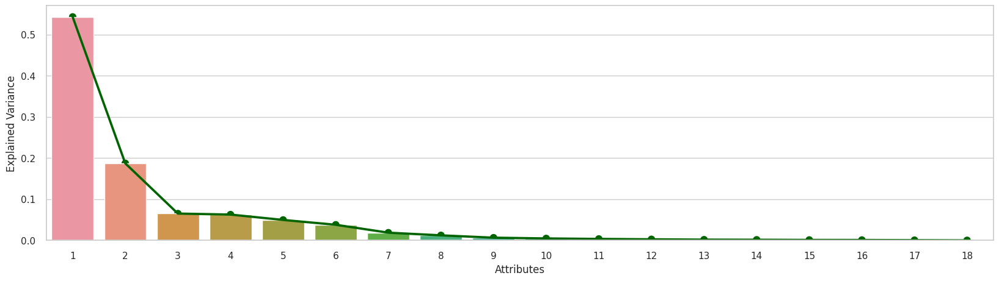

In [63]:
f, axes = plt.subplots(1, 1, figsize=(20, 5))
sns.barplot(list(range(1,19)), pca_full.explained_variance_ratio_,ax=axes)
plot = sns.pointplot(list(range(1,19)), pca_full.explained_variance_ratio_,ax=axes, color='darkgreen')
plot.set_xlabel('Attributes')
plot.set_ylabel('Explained Variance')

In [64]:
# pca with 8 components
pca8 = PCA(n_components=8)
X_PCA8 = pca8.fit_transform(X)

In [65]:
p_plot_data = pd.DataFrame(X_PCA8)
p_plot_data['class'] = y

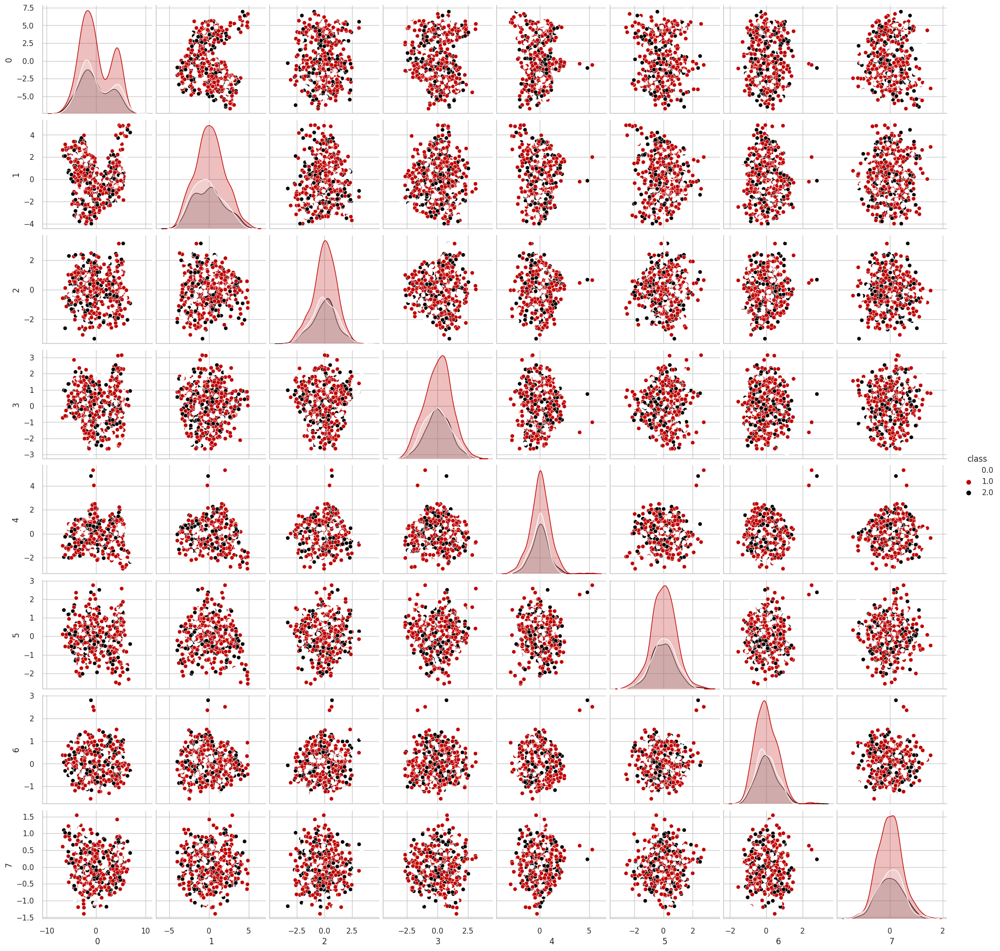

In [66]:
sns.pairplot(p_plot_data, diag_kind='kde', hue='class', palette='gist_heat_r')

In [67]:
X_pca_train, X_pca_test, y_train, y_test = train_test_split(X_PCA8, y, test_size =.30, random_state=10)

printmd('**Training and Testing Set Distribution**', color='brown')

print(f'Training set has {X_pca_train.shape[0]} rows and {X_pca_train.shape[1]} columns')
print(f'Testing set has {X_pca_test.shape[0]} rows and {X_pca_test.shape[1]} columns')

<span style='color:brown'>**Training and Testing Set Distribution**</span>

Training set has 585 rows and 8 columns

Testing set has 252 rows and 8 columns


In [68]:
svm.fit(X_pca_train, y_train)  
y_train_pred = svm.predict(X_pca_train)
y_test_pred = svm.predict(X_pca_test)

#get Precision Score on train and test
accuracy_train = round(metrics.accuracy_score(y_train, y_train_pred),3)
accuracy_test = round(metrics.accuracy_score(y_test, y_test_pred),3)
accdf_pca = pd.DataFrame([[accuracy_train],[accuracy_test]], index=['Training', 'Testing'], columns=['Accuracy'])  
accdf_pca
#This is a good model as we have accuracy of 96.4% for training set and 92.9% for test set.


,Accuracy
Training,0.964
Testing,0.929


In [69]:
results = cross_val_score(svm, X_PCA8, y, cv=kfold)
print(results)
kfold_result_pca = pd.DataFrame([[results.mean()*100.0, results.std()*100.0]], index=['KFold'], columns=['Mean Accuracy', 'Standard Deviation'])
kfold_result_pca

[1.         0.82352941 1.         0.94117647 0.94117647 1.

 0.94117647 1.         1.         1.         0.94117647 1.

 0.94117647 0.94117647 1.         0.94117647 0.94117647 0.94117647

 1.         1.         1.         0.94117647 0.94117647 1.

 1.         1.         0.94117647 1.         0.94117647 0.94117647

 0.94117647 0.82352941 1.         0.94117647 0.82352941 0.88235294

 1.         0.9375     1.         0.875      0.875      1.

 0.9375     0.9375     0.875      1.         0.875      0.9375

 1.         0.9375    ]


,Mean Accuracy,Standard Deviation
KFold,95.198529,5.08705


In [70]:
confusion_matrix_test_pca = pd.crosstab(y_test, y_test_pred, rownames=['Actual'], colnames=['Predicted'])
confusion_matrix_test_pca

Predicted,0,1,2
Actual,,,
0,70,3,2
1,2,113,4
2,3,4,51


Even after reducing dimensions from 13 to 8, we still have achieved very good results by doing PCA in terms for accuracy.

In [71]:
printmd('**SVM Standard**', color='brown')
display_side_by_side([accdf, kfold_result,confusion_matrix_test])

<span style='color:brown'>**SVM Standard**</span>

Accuracy 
 
 
 
 
 Training 
 0.971 
 
 
 Testing 
 0.937 
 
 
 
 
 
 
 Mean Accuracy 
 Standard Deviation 
 
 
 
 
 KFold 
 96.404412 
 4.939234 
 
 
 
 
 
 Predicted 
 0 
 1 
 2 
 
 
 Actual 
 
 
 
 
 
 
 
 0 
 71 
 2 
 2 
 
 
 1 
 2 
 114 
 3 
 
 
 2 
 3 
 4 
 51

In [72]:
printmd('**SVM with PCA**', color='brown')
display_side_by_side([accdf_pca, kfold_result_pca,confusion_matrix_test_pca])

<span style='color:brown'>**SVM with PCA**</span>

Accuracy 
 
 
 
 
 Training 
 0.964 
 
 
 Testing 
 0.929 
 
 
 
 
 
 
 Mean Accuracy 
 Standard Deviation 
 
 
 
 
 KFold 
 95.198529 
 5.08705 
 
 
 
 
 
 Predicted 
 0 
 1 
 2 
 
 
 Actual 
 
 
 
 
 
 
 
 0 
 70 
 3 
 2 
 
 
 1 
 2 
 113 
 4 
 
 
 2 
 3 
 4 
 51